In [1]:
import pandas as pd
import numpy as np
import cv2
import xml
import xml.etree.ElementTree as ET
import os
import matplotlib.pyplot as plt
from skimage.transform import resize

In [2]:
# Where is the data?

# Let's do everything from scratch, so that we know what we are doing

In [3]:
# The Bayesian task point us towards this location

# Train data locations
block_0101 = '../../../Spring_2024/S_lab_TasselNet/Block_1_TN/Block_1_images_and_xml'
block_0102 = '../../../Spring_2024/S_lab_TasselNet/Block_2_TN/Block_2_images_and_xml'
block_0203 = '../../../Spring_2024/S_lab_TasselNet/Block_9_TN/Block_9_images_and_xml'
block_0301 = '../../../Spring_2024/S_lab_TasselNet/Block_13_TN/Block_13_images_and_xml'

# train_blocks = [block_0101, block_0102, block_0203, block_0301]

# valid data location
block_0204 = '../../../Spring_2024/S_lab_TasselNet/Block_10_TN/Block_10_images_and_xml'

# valid_blocks = [block_0204]

In [4]:
# Should we do the preprocessing for one block first, and then repeat it for the rest? May be write a function for this?

In [5]:
# consider the block 0101
block_0101_list = os.listdir(block_0101)
block_0101_list.sort()

In [6]:
# from this list, we will only cosider the last 20 time points

# first separate the xml and jpeg files

# xml files
xml_files = [file for file in block_0101_list if file.split('.')[-1] == 'xml']
xml_files.sort()

# jpeg files
jpeg_files = [file for file in block_0101_list if file not in xml_files]
jpeg_files.sort()

In [7]:
# get only the final 20 items of the list -  we are only interested in the final 20 as they are the only ones in the same horizontal direction - meaning capturing the same field over time

chosen_xml_files = xml_files[-20:]
chosen_jpeg_files = jpeg_files[-20:]

# make sure the xml and jpeg files correspond to each other?
np.mean([file.split('.')[0] for file in chosen_xml_files] == [file.split('.')[0] for file in chosen_jpeg_files])

1.0

In [8]:
# Also from these , we need the first 13 image files in the sequence, and the last 7 xml files for our task - Let's specify this
task_specific_image_files = chosen_jpeg_files[:13]
task_specific_xml_files = chosen_xml_files[-7:]

In [9]:
len(task_specific_image_files), len(task_specific_xml_files)

(13, 7)

In [10]:
# Have these in a function for future blocks

def chose_xml_and_jpeg(file_location):
    # list all files in location
    list_of_all_files = os.listdir(file_location)
    # sort files
    list_of_all_files.sort()
    # separate xml and jpeg files
    all_xml_files = [file for file in list_of_all_files if file.split('.')[-1] == 'xml']
    all_jpeg_files = [file for file in list_of_all_files if file not in all_xml_files]
    # get the final 20 files
    chosen_xml_files = all_xml_files[-20:]
    chosen_jpeg_files = all_jpeg_files[-20:]
    # make sure the xml and jpeg files correspond to each other?
    mean = np.mean([file.split('.')[0] for file in chosen_xml_files] == [file.split('.')[0] for file in chosen_jpeg_files])

    # chose the required files only
    task_specific_image_files = chosen_jpeg_files[:13]
    task_specific_xml_files = chosen_xml_files[-7:]
    return(task_specific_image_files, task_specific_xml_files, mean)

In [11]:
# see if this works
try_for_blk1 = chose_xml_and_jpeg(block_0101)
try_for_blk1[-1]

1.0

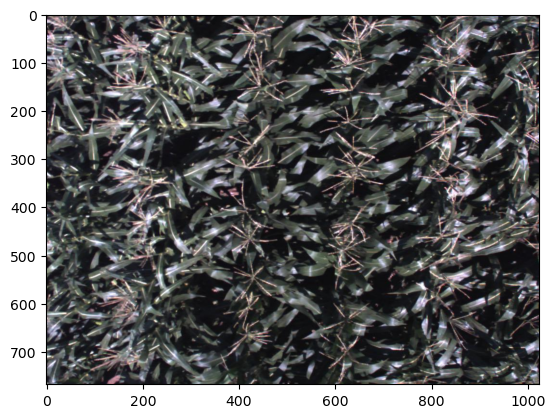

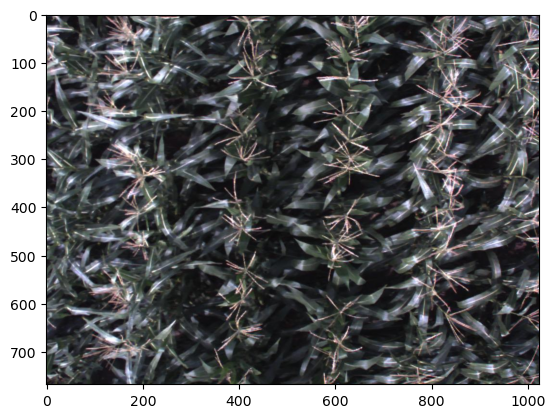

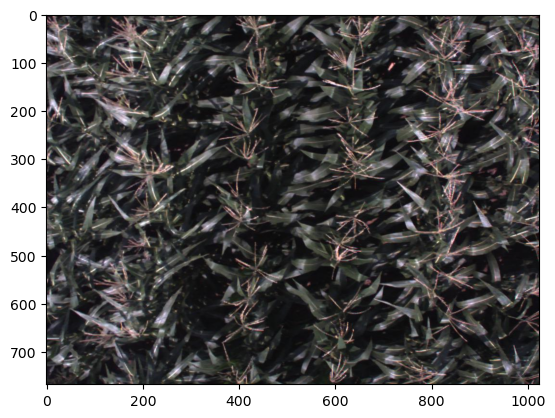

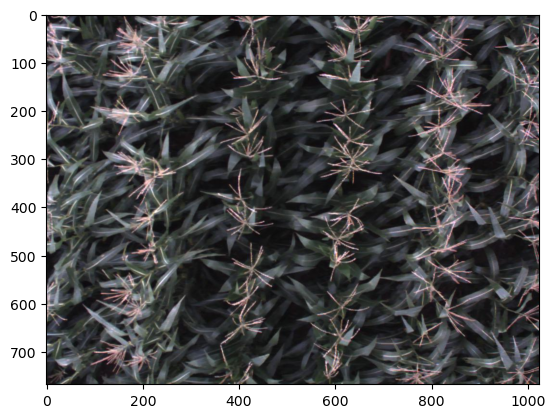

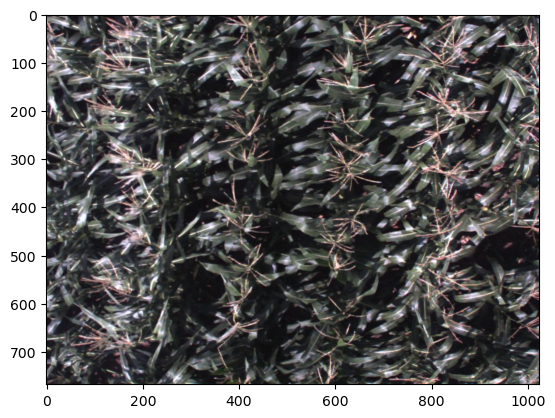

...

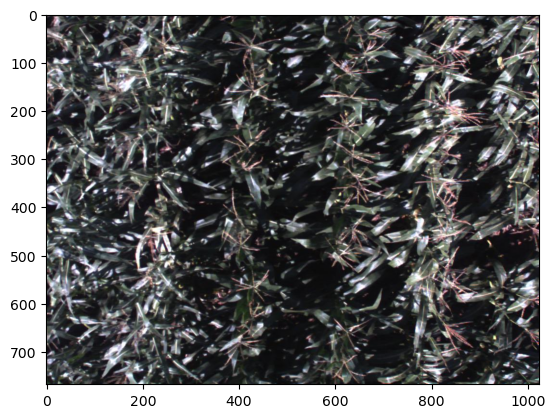

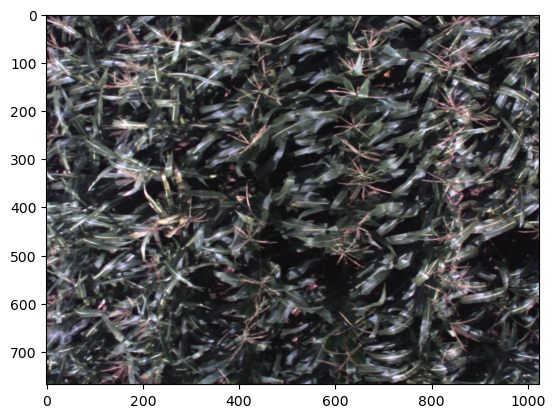

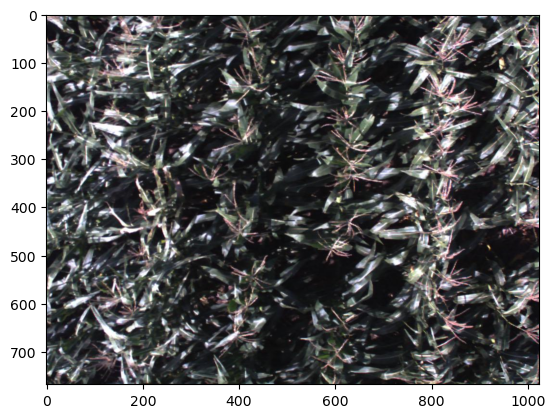

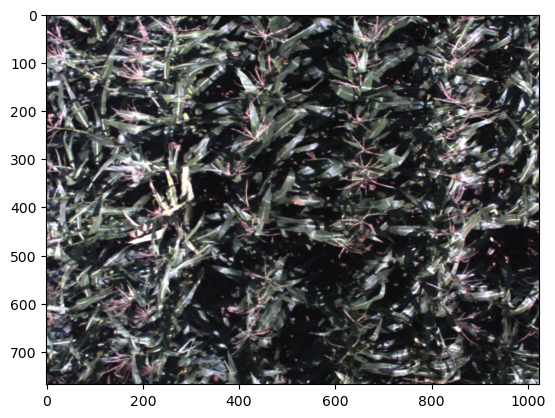

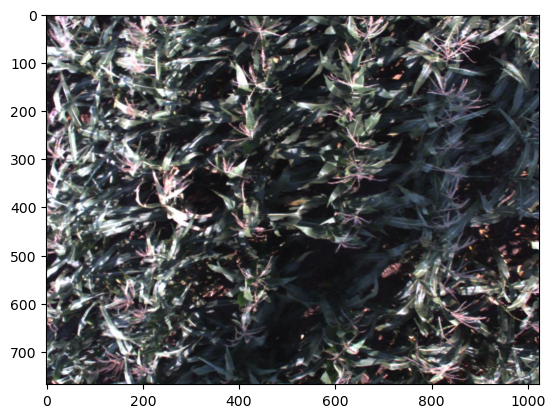

In [12]:
# We need to create the train features and the responses data now

# let's first load the images? - Let's think of the images first, and then the corresponding responses

# load the image data - we need images collected periodically - for each sub-image, the input features should have shape (13, 32, 32, 3) - and the resonse would be of shape (7,)
all_images = []
for file in task_specific_image_files:
    joined_path = os.path.join(block_0101, file)
    read_image = plt.imread(joined_path)
    plt.imshow(read_image)
    plt.show()
    all_images.append(read_image)

In [13]:
# Think of just the first sub-window sequence - what should happen?

# we need to create 32, 32, 3 images for the first 13 images
kernel_size = 32
sub_1_windows = []
for file in all_images:
    chosen_window = file[:kernel_size, :kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_1_windows.append(chosen_window)

In [14]:
all_images[0].shape

(768, 1024, 3)

In [15]:
len(sub_1_windows)

13

In [16]:
sub_1_windows[0].shape

(32, 32, 3)

In [17]:
# sub_1_windows[0]

In [18]:
# stack these to get the time-wise sub-windows
stacked_sub1_window = np.stack(sub_1_windows)

In [19]:
stacked_sub1_window.shape

(13, 32, 32, 3)

In [20]:
# Okay, now this needs to happen to all sub window sequences - How should we proceed?

In [21]:
%%time
# try writing a stupid function - no idea if this will work

im_height = all_images[0].shape[0]
im_width = all_images[0].shape[1]
stride = 8
kernel_size = 32
n_channels = 3
catch_subwindows_all = []

for i in range(0, im_height, stride):
    for j in range(0, im_width, stride):
        will_this_work = []
        for im_file in all_images:
            chosen_window = im_file[i:i+kernel_size, j:j+kernel_size, :]
            # resize the window
            chosen_window = resize(chosen_window, (kernel_size, kernel_size ,n_channels))
            will_this_work.append(chosen_window)
        catch_subwindows_all.append(will_this_work)

CPU times: user 39 s, sys: 1.56 s, total: 40.6 s
Wall time: 40.8 s


In [22]:
type(catch_subwindows_all)

list

In [23]:
len(catch_subwindows_all)

12288

In [24]:
%%time
# What if we stack all these together?
try_stack = np.stack(catch_subwindows_all)

CPU times: user 926 ms, sys: 2.25 s, total: 3.18 s
Wall time: 3.19 s


In [25]:
try_stack.shape

(12288, 13, 32, 32, 3)

In [26]:
# Need to verify if what's done above is correct

In [27]:
# Assuming it is, put this inside a function

In [28]:
def create_and_stack_subwindows(im_height, im_width, stride, kernel_size, n_channels, im_list):
    # initiate an empty list
    catch_all_subwindows = []
    for i in range(0, im_height, stride):
        for j in range(0, im_width, stride):
            local_list_at_subimage_sequence_level= []
            for im_file in im_list:
                chosen_window = im_file[i:i+kernel_size, j:j+kernel_size, :]
                # resize the window
                chosen_window = resize(chosen_window, (kernel_size, kernel_size ,n_channels))
                local_list_at_subimage_sequence_level.append(chosen_window)
            catch_all_subwindows.append(local_list_at_subimage_sequence_level)
    # stack all these together
    Stacked_subwindows = np.stack(catch_all_subwindows)
    return(Stacked_subwindows)
    

In [29]:
%%time
# try this
try_this = create_and_stack_subwindows(im_height, im_width, stride, kernel_size, n_channels, all_images)

CPU times: user 39.5 s, sys: 2.23 s, total: 41.8 s
Wall time: 41.9 s


In [30]:
# Verify this code

In [31]:
try_this.shape

(12288, 13, 32, 32, 3)

In [32]:
# Okay, we will verify this

In [33]:
%%time
# Need to add a counter for all the sub-windows getting created for tracking purposes

im_height = all_images[0].shape[0]
im_width = all_images[0].shape[1]
stride = 8
kernel_size = 32
n_channels = 3
catch_subwindows_all = []
sub_window_name_list = []
counter = 0
for i in range(0, im_height, stride):
    for j in range(0, im_width, stride):
        will_this_work = []
        for im_file in all_images:
            chosen_window = im_file[i:i+kernel_size, j:j+kernel_size, :]
            # resize the window
            chosen_window = resize(chosen_window, (kernel_size, kernel_size ,n_channels))
            will_this_work.append(chosen_window)
        catch_subwindows_all.append(will_this_work)
        sub_window_name_list.append("sub_image_seq_" + str(counter))
        counter = counter + 1

CPU times: user 38.6 s, sys: 36.4 ms, total: 38.7 s
Wall time: 38.8 s


In [34]:
len(sub_window_name_list)

12288

In [35]:
sub_window_name_list[0], sub_window_name_list[-1]

('sub_image_seq_0', 'sub_image_seq_12287')

In [36]:
# First we need to verify that teh wrotten code is correct - Do some sanity checks here before proceeding to make sure that the code written is correct

In [37]:
%%time
# Okay, how to go about this?

# create a stack iwth the created list

stack_alt = np.stack(catch_subwindows_all)

CPU times: user 1.28 s, sys: 648 ms, total: 1.93 s
Wall time: 1.94 s


In [38]:
stack_alt.shape

(12288, 13, 32, 32, 3)

Sanity checks

In [39]:
# the first subwindow
first_sub_window_seq = stack_alt[0, :,:,:,:]

In [40]:
first_sub_window_seq.shape

(13, 32, 32, 3)

In [41]:
# check if this is the same with the one we already calculated earlier
np.mean(stacked_sub1_window == first_sub_window_seq)

1.0

In [42]:
# check this also with the function output
np.mean(try_this[0,:,:,:,:] == first_sub_window_seq)

1.0

In [43]:
np.mean(try_this[0,:,:,:,:] == stacked_sub1_window)

1.0

In [44]:
# Okay, let's try and get the other subwindows one by one, anc compare with the fucntion output and the last output

In [45]:
sub_window_name_list[1]

'sub_image_seq_1'

In [46]:
# subwindow 2

# we need to create 32, 32, 3 images for the first 13 images
kernel_size = 32
stride = 8
sub_2_windows = []
for file in all_images:
    chosen_window = file[:kernel_size, stride:stride+kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_2_windows.append(chosen_window)

In [47]:
# file[stride:stride+kernel_size, stride:stride+kernel_size, :].shape

In [48]:
stacked_sub2_window = np.stack(sub_2_windows)

In [49]:
stacked_sub2_window.shape

(13, 32, 32, 3)

In [50]:
# check if this is the same with the one we already calculated earlier
np.mean(stacked_sub2_window == stack_alt[1, :,:,:,:])

1.0

In [51]:
# check this also with the function output
np.mean(try_this[1,:,:,:,:] == stacked_sub2_window)

1.0

In [52]:
# check this also with the function output
np.mean(stack_alt[1,:,:,:,:] == try_this[1,:,:,:,:])

1.0

In [53]:
# Okay, so how many subs we have per row?

# that would be 1024/8 = 128
# how many vertically? - 96



In [54]:
# Let's check some random ones to ensure we are doing his correct

# What about row 5 (idx 4) - sub seq 8(idx 7)
kernel_size = 32
stride = 8
sub_519_windows = []
for file in all_images:
    chosen_window = file[stride*4:stride*4 + kernel_size, stride*7:stride*7+kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_519_windows.append(chosen_window)

In [55]:
# stacked_sub2_window

In [56]:
# stack_alt[1, :,:,:,:]

In [57]:
# What would be the index of the subwindow here?
127 + 128*3+8

519

In [58]:
# Let's do the sanity check

In [59]:
# sub_519_windows

In [60]:
# check if this is the same with the one we already calculated earlier
np.mean(sub_519_windows == stack_alt[519, :,:,:,:])

1.0

In [61]:
# check this also with the function output
np.mean(try_this[519,:,:,:,:] == sub_519_windows)

1.0

In [62]:
np.mean(try_this[519,:,:,:,:] == stack_alt[519, :,:,:,:])

1.0

In [63]:
# Could we not do this in a loop though? This would be tough, let's randomly check a few more subwindows and then move to the responses

In [64]:
# What about row 90 (idx 89) - sub seq 128(idx 127)
kernel_size = 32
stride = 8
sub_11519_windows = []
for file in all_images:
    chosen_window = file[stride*89:stride*89 + kernel_size, stride*127:stride*127+kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_11519_windows.append(chosen_window)

In [65]:
# what is the subwindow index? - 127+128*89

In [66]:
127+128*89

11519

In [67]:
# check if this is the same with the one we already calculated earlier
np.mean(sub_11519_windows == stack_alt[11519, :,:,:,:])

1.0

In [68]:
# check this also with the function output
np.mean(try_this[11519,:,:,:,:] == sub_11519_windows)

1.0

In [69]:
np.mean(try_this[11519,:,:,:,:] == stack_alt[11519, :,:,:,:])

1.0

In [70]:
# Do a few more

In [71]:
# What about row 96 (idx 95) - sub seq 102(idx 101)
kernel_size = 32
stride = 8
sub_12261_windows = []
for file in all_images:
    chosen_window = file[stride*95:stride*95 + kernel_size, stride*101:stride*101+kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_12261_windows.append(chosen_window)

In [72]:
# What is the corresponding subwindow number?

In [73]:
127+128*94+102

12261

In [74]:
# check if this is the same with the one we already calculated earlier
np.mean(sub_12261_windows == stack_alt[12261, :,:,:,:])

1.0

In [75]:
# check this also with the function output
np.mean(try_this[12261,:,:,:,:] == sub_12261_windows)

1.0

In [76]:
np.mean(try_this[12261,:,:,:,:] == stack_alt[12261, :,:,:,:])

1.0

In [77]:
# try_this[12261,:,:,:,:]

In [78]:
# What about row 52 (idx 51) - sub seq 63 (idx 62)
kernel_size = 32
stride = 8
sub_6590_windows = []
for file in all_images:
    chosen_window = file[stride*51:stride*51 + kernel_size, stride*62:stride*62+kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_6590_windows.append(chosen_window)

In [79]:
# What is the corresponding index?
127+128*50+63

6590

In [80]:
# check if this is the same with the one we already calculated earlier
np.mean(sub_6590_windows == stack_alt[6590, :,:,:,:])

1.0

In [81]:
# check this also with the function output
np.mean(try_this[6590,:,:,:,:] == sub_6590_windows)

1.0

In [82]:
np.mean(try_this[6590,:,:,:,:] == stack_alt[6590, :,:,:,:])

1.0

In [83]:
# What about row 78 (idx 77) - sub seq 25 (idx 24)
kernel_size = 32
stride = 8
sub_9880_windows = []
for file in all_images:
    chosen_window = file[stride*77:stride*77 + kernel_size, stride*24:stride*24+kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_9880_windows.append(chosen_window)

In [84]:
# corresponding index
127+128*76+25

9880

In [85]:
# check if this is the same with the one we already calculated earlier
np.mean(sub_9880_windows == stack_alt[9880, :,:,:,:])

1.0

In [86]:
# check this also with the function output
np.mean(try_this[9880,:,:,:,:] == sub_9880_windows)

1.0

In [87]:
np.mean(try_this[9880,:,:,:,:] == stack_alt[9880, :,:,:,:])

1.0

In [88]:
# What about row 45 (idx 44) - sub seq 12 (idx 11)
kernel_size = 32
stride = 8
sub_5643_windows = []
for file in all_images:
    chosen_window = file[stride*44:stride*44 + kernel_size, stride*11:stride*11+kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_5643_windows.append(chosen_window)

In [89]:
# corresponding index
127+128*43+12

5643

In [90]:
# check if this is the same with the one we already calculated earlier
np.mean(sub_5643_windows == stack_alt[5643, :,:,:,:])

1.0

In [91]:
# check this also with the function output
np.mean(try_this[5643,:,:,:,:] == sub_5643_windows)

1.0

In [92]:
np.mean(try_this[5643,:,:,:,:] == stack_alt[5643, :,:,:,:])

1.0

In [93]:
# What about row 89 (idx 88) - sub seq 110 (idx 109)
kernel_size = 32
stride = 8
sub_11373_windows = []
for file in all_images:
    chosen_window = file[stride*88:stride*88 + kernel_size, stride*109:stride*109+kernel_size, :]
    # use resizing here, as it performs a local kind of normalization
    chosen_window = resize(chosen_window, (32,32,3))
    # plt.imshow(chosen_window)
    # plt.show()
    sub_11373_windows.append(chosen_window)

In [94]:
# corresponding index
127+128*87+110

11373

In [95]:
# check if this is the same with the one we already calculated earlier
np.mean(sub_11373_windows == stack_alt[11373, :,:,:,:])

1.0

In [96]:
# check this also with the function output
np.mean(try_this[11373,:,:,:,:] == sub_11373_windows)

1.0

In [97]:
np.mean(try_this[11373,:,:,:,:] == stack_alt[11373, :,:,:,:])

1.0

In [98]:
# The random sanity check agrees with what we had done, therefore let's move forward to the response.
# Let's jus add the counter in the defined function just in-case it becomes useful later

In [99]:
def create_and_stack_subwindows(im_height, im_width, stride, kernel_size, n_channels, im_list):
    # initiate an empty list
    catch_all_subwindows = []
    sub_window_name_list = []
    counter = 0
    for i in range(0, im_height, stride):
        for j in range(0, im_width, stride):
            local_list_at_subimage_sequence_level= []
            for im_file in im_list:
                chosen_window = im_file[i:i+kernel_size, j:j+kernel_size, :]
                # resize the window
                chosen_window = resize(chosen_window, (kernel_size, kernel_size ,n_channels))
                local_list_at_subimage_sequence_level.append(chosen_window)
            catch_all_subwindows.append(local_list_at_subimage_sequence_level)
            sub_window_name_list.append("sub_image_seq_" + str(counter))
            counter = counter + 1
    # stack all these together
    Stacked_subwindows = np.stack(catch_all_subwindows)
    return(Stacked_subwindows, sub_window_name_list)

In [100]:
%%time
# see if this works properly
final_function_subs, final_fnc_name_list = create_and_stack_subwindows(im_height, im_width, stride, kernel_size, n_channels, all_images)

CPU times: user 39.4 s, sys: 1.32 s, total: 40.7 s
Wall time: 40.8 s


In [101]:
final_fnc_name_list[0], final_fnc_name_list[1], final_fnc_name_list[-1]

('sub_image_seq_0', 'sub_image_seq_1', 'sub_image_seq_12287')

In [102]:
# sanity check here

In [103]:
all_means = []
for i in range(12288):
    all_means.append((np.mean(stack_alt[i, :,:,:,:] == final_function_subs[i,:,:,:,:])))

np.mean(all_means)

1.0

In [104]:
# The function works good.

In [105]:
# So our final two functions from the exercise to get the subwindows ready for the CNN-LSTM are as below. We also need the for loop for getting the required image files for each block to the the final subwindow sequences

In [106]:
# def chose_xml_and_jpeg(file_location):
#     # list all files in location
#     list_of_all_files = os.listdir(file_location)
#     # sort files
#     list_of_all_files.sort()
#     # separate xml and jpeg files
#     all_xml_files = [file for file in list_of_all_files if file.split('.')[-1] == 'xml']
#     all_jpeg_files = [file for file in list_of_all_files if file not in all_xml_files]
#     # get the final 20 files
#     chosen_xml_files = all_xml_files[-20:]
#     chosen_jpeg_files = all_jpeg_files[-20:]
#     # make sure the xml and jpeg files correspond to each other?
#     mean = np.mean([file.split('.')[0] for file in chosen_xml_files] == [file.split('.')[0] for file in chosen_jpeg_files])

#     # chose the required files only
#     task_specific_image_files = chosen_jpeg_files[:13]
#     task_specific_xml_files = chosen_xml_files[-7:]
#     return(task_specific_image_files, task_specific_xml_files, mean)

In [107]:
# all_images = []
# for file in task_specific_image_files:
#     joined_path = os.path.join(block_0101, file)
#     read_image = plt.imread(joined_path)
#     plt.imshow(read_image)
#     plt.show()
#     all_images.append(read_image)

In [108]:
# def create_and_stack_subwindows(im_height, im_width, stride, kernel_size, n_channels, im_list):
#     # initiate an empty list
#     catch_all_subwindows = []
#     sub_window_name_list = []
#     counter = 0
#     for i in range(0, im_height, stride):
#         for j in range(0, im_width, stride):
#             local_list_at_subimage_sequence_level= []
#             for im_file in im_list:
#                 chosen_window = im_file[i:i+kernel_size, j:j+kernel_size, :]
#                 # resize the window
#                 chosen_window = resize(chosen_window, (kernel_size, kernel_size ,n_channels))
#                 local_list_at_subimage_sequence_level.append(chosen_window)
#             catch_all_subwindows.append(local_list_at_subimage_sequence_level)
#             sub_window_name_list.append("sub_image_seq_" + str(counter))
#             counter = counter + 1
#     # stack all these together
#     Stacked_subwindows = np.stack(catch_all_subwindows)
#     return(Stacked_subwindows, sub_window_name_list)

In [115]:
# Let's store the subwindow sequences from here before getting into the responses

In [116]:
np.save('All_data/block_0101/subwindow_seqs_0101.npy', final_function_subs)

In [117]:
final_function_subs.shape

(12288, 13, 32, 32, 3)

In [109]:
# Okay, now what about the responses. Need to see how the response should pre prepared as well

In [110]:
# chose_xml_and_jpeg gives the mxl files corresponding to the response data
# we can use that, and proceed with getting the densities corresponsing to the sub windows

In [111]:
# The xml files for the task 
task_specific_xml_files

['Block0101_2020_08_26.xml',
 'Block0101_2020_08_27.xml',
 'Block0101_2020_08_28.xml',
 'Block0101_2020_08_31.xml',
 'Block0101_2020_09_02.xml',
 'Block0101_2020_09_07.xml',
 'Block0101_2020_09_16.xml']

In [112]:
# Corresponding image files
response_image_files = [im_file for im_file in chosen_jpeg_files if im_file.split('.')[0] + '.xml' in task_specific_xml_files]

In [113]:
response_image_files

['Block0101_2020_08_26.jpeg',
 'Block0101_2020_08_27.jpeg',
 'Block0101_2020_08_28.jpeg',
 'Block0101_2020_08_31.jpeg',
 'Block0101_2020_09_02.jpeg',
 'Block0101_2020_09_07.jpeg',
 'Block0101_2020_09_16.jpeg']

In [114]:
# Okay, now what to do with these?
# We need these parse, and the density maps created - Let's use the earlier codes for this

# Let's first create and store the density maps, then create the response stack for each block

# plot these image files to see how these looks like, and then proceed from there

In [119]:
# sort the file lists first just in case
task_specific_xml_files.sort()
response_image_files.sort()

In [123]:
len(task_specific_xml_files), len(response_image_files)

(7, 7)

In [124]:
# Think we first need to store these images as np arrays - since we onl have 7 images for the response in each block, let's do all the storing and preprocessing here so that e are not later confused

In [125]:
# define a function to store horizontal images
def store_images_as_np_arrays_horizontal(img_old_path, img_name, img_store_path):
    # join the path
    image_path = os.path.join(img_old_path, img_name)
    # read the image
    read_image = plt.imread(image_path)
    image_size = read_image.shape
    # show the image
    plt.imshow(read_image)
    plt.show()
    # save the image in new location
    np.save(img_store_path + '/' + img_name.split(".")[0] + '.npy', read_image)
    return(image_size)

In [128]:
old_path = block_0101 
new_store_path = 'All_data/block_0101/all_np_files'

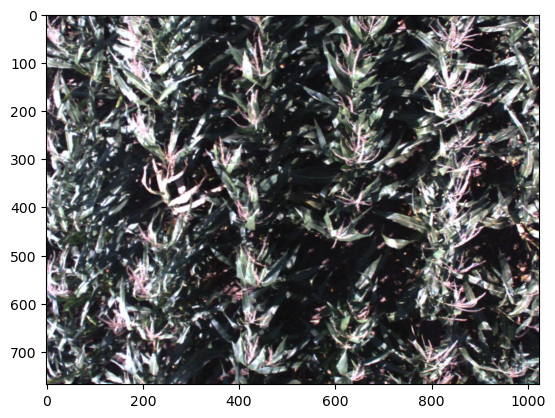

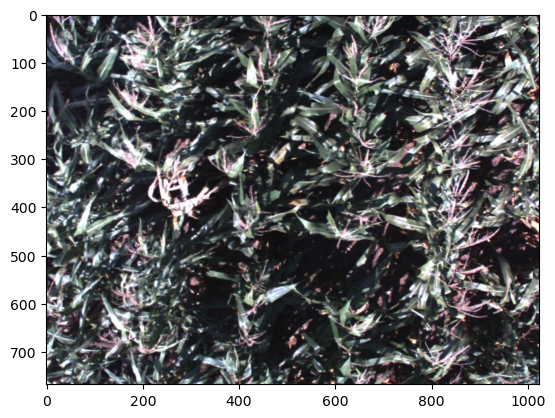

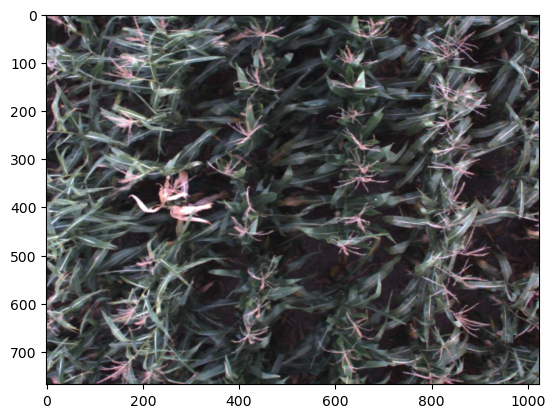

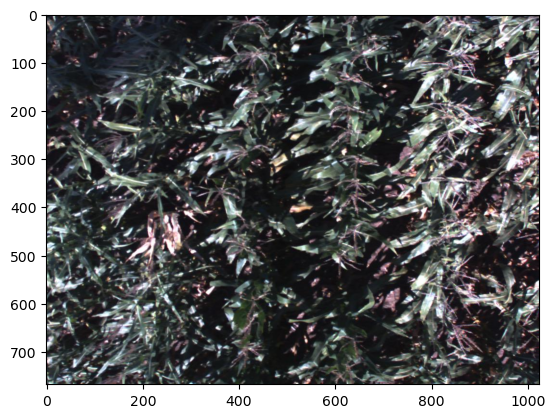

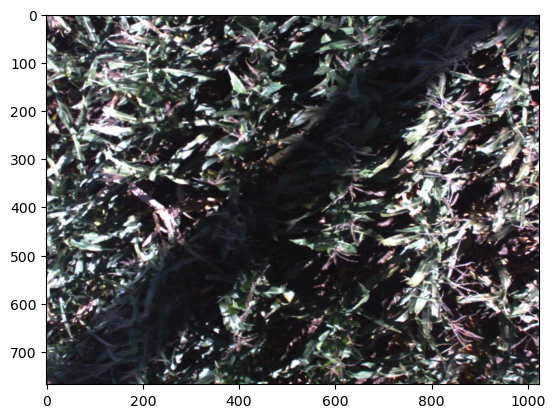

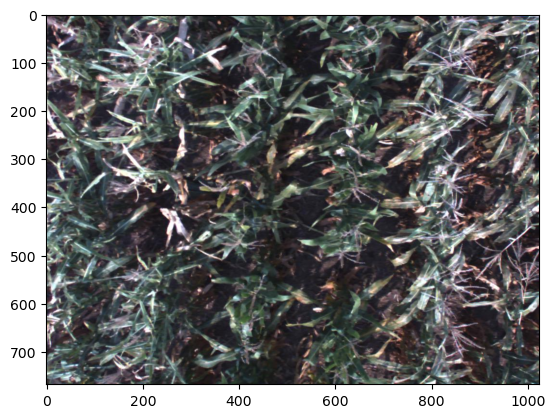

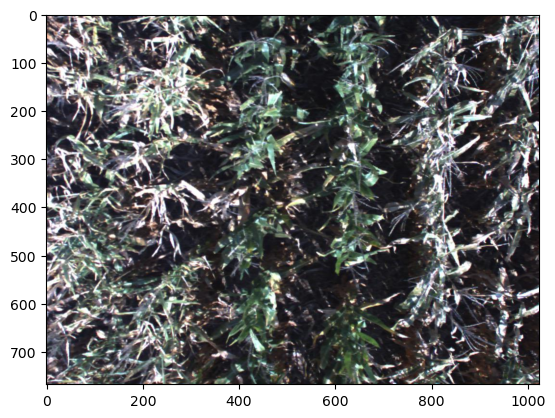

In [129]:
all_im_sizes = []
for file in response_image_files:
    im_size = store_images_as_np_arrays_horizontal(old_path, file, new_store_path)
    all_im_sizes.append(im_size)

In [131]:
all_im_sizes

[(768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3),
 (768, 1024, 3)]

In [130]:
# Now create the corresponding density maps and store them?